# Preparations

Imports:

In [1]:
import pandas as pd
import seaborn as sns
import folium
from folium.plugins import HeatMap
import numpy as np
import scipy.stats as ss
from scipy.stats import spearmanr
import holidays
from sklearn.metrics import auc
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OneHotEncoder
import matplotlib.pyplot as plt
from sklearn.metrics import roc_auc_score, roc_curve
from sklearn.model_selection import cross_val_score
from sklearn.metrics import make_scorer
from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import RandomForestClassifier
import xgboost as xgb
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from pandas.api.types import is_numeric_dtype
from sklearn.ensemble import VotingClassifier
from sklearn.metrics import confusion_matrix as cm

Data reading:

In [2]:
data = pd.read_csv('data.csv')
data = data.drop(columns='Unnamed: 0') # remove Unnamed: 0 column

# Cleaning Data

In [3]:
def validate_long_lat(X_train, X_test, X_val, mode_values):
    most_common_lat = mode_values['LATITUDE']
    most_common_long = mode_values['LATITUDE']

    for df in [X_train, X_test, X_val]:
        lat_invalid_mask = (df['LATITUDE'] < -90) | (df['LATITUDE'] > 90)
        df.loc[lat_invalid_mask, 'LATITUDE'] = most_common_lat

        long_invalid_mask = (df['LONGITUDE'] < -180) | (df['LONGITUDE'] > 180)
        df.loc[long_invalid_mask, 'LONGITUDE'] = most_common_long
    return X_train, X_test, X_val

In [4]:
def replace_null_with_mode(X_train, X_test, X_val):
    mode_values_train = X_train.mode().iloc[0]

    # the mode amount of time between the discovery date and cont_date in the train is 0
    # so we are setting the CONT_DATE to be the DISCOVERY_DATE for missing values
    for df in [X_train, X_test, X_val]:
        null_mask = df['CONT_DOY'].isnull()
        df.loc[null_mask, 'CONT_DOY'] = df.loc[null_mask, 'DISCOVERY_DOY']


    # replacing the rest of the missing values with the mode value in the train
    X_train.fillna(mode_values_train, inplace=True)
    X_val.fillna(mode_values_train, inplace=True)
    X_test.fillna(mode_values_train, inplace=True)

    return X_train, X_test, X_val, mode_values_train

# Data Preprocessing

Split to train, test and validation

In [5]:
from sklearn.model_selection import train_test_split
# drop duplicates from the data
data = data.drop_duplicates()

train, test = train_test_split(data, test_size=0.2, random_state=42)
train, val = train_test_split(train, test_size=0.2, random_state=42)

y_train = train['STAT_CAUSE_DESCR']
X_train = train.drop(columns='STAT_CAUSE_DESCR')
y_test = test['STAT_CAUSE_DESCR']
X_test = test.drop(columns='STAT_CAUSE_DESCR')
y_val = val['STAT_CAUSE_DESCR']
X_val = val.drop(columns='STAT_CAUSE_DESCR')

Cleaning the data:

In [6]:
X_train, X_test, X_val, mode_values_train = replace_null_with_mode(X_train, X_test, X_val)
X_train, X_test, X_val = validate_long_lat(X_train, X_test, X_val, mode_values_train[['LATITUDE', 'LONGITUDE']])

Remove unnecessary features:

In [7]:
columns_to_drop = ['OBJECTID','FOD_ID','FPA_ID','LOCAL_FIRE_REPORT_ID','FIRE_NAME','LOCAL_INCIDENT_ID','Shape']
X_train.drop(columns_to_drop, axis=1, inplace=True)
X_val.drop(columns_to_drop, axis=1, inplace=True)
X_test.drop(columns_to_drop, axis=1, inplace=True)

In [8]:
X_train.head(100)

,SOURCE_SYSTEM_TYPE,SOURCE_SYSTEM,NWCG_REPORTING_AGENCY,NWCG_REPORTING_UNIT_ID,NWCG_REPORTING_UNIT_NAME,SOURCE_REPORTING_UNIT,SOURCE_REPORTING_UNIT_NAME,FIRE_CODE,ICS_209_INCIDENT_NUMBER,ICS_209_NAME,...,FIRE_SIZE,FIRE_SIZE_CLASS,LATITUDE,LONGITUDE,OWNER_CODE,OWNER_DESCR,STATE,COUNTY,FIPS_CODE,FIPS_NAME
271458,NONFED,ST-NCNCS,ST/C&L,USNCNCS,North Carolina Forest Service,NCNCS309,NCS Region 3 District 9,D44Z,OK-OSA-100020,OSAGE-MIAMI COMPLEX,...,0.50,B,35.133300,-82.866700,14.0,MISSING/NOT SPECIFIED,NC,5,5.0,Lincoln
529009,NONFED,ST-SDSDS,ST/C&L,USSDMURX,Murdo Volunteer Fire Department,SDMURX,Murdo Volunteer Fire Department,D44Z,OK-OSA-100020,OSAGE-MIAMI COMPLEX,...,3.00,B,43.825190,-100.830040,8.0,PRIVATE,SD,5,5.0,Lincoln
41725,NONFED,ST-NASF,ST/C&L,USGAGAS,Georgia Forestry Commission,GAGAS,Georgia Forestry Commission,D44Z,OK-OSA-100020,OSAGE-MIAMI COMPLEX,...,0.25,A,31.596940,-85.056379,7.0,STATE,GA,Clay,61.0,Clay
26943,NONFED,ST-NASF,ST/C&L,USMNMNS,Minnesota Department of Natural Resources,MNMNS,Minnesota Department of Natural Resources,D44Z,OK-OSA-100020,OSAGE-MIAMI COMPLEX,...,15.00,C,45.945374,-93.996576,14.0,MISSING/NOT SPECIFIED,MN,Morrison,97.0,Morrison
94305,NONFED,ST-ALALS,ST/C&L,USALALS,Alabama Forestry Commission,ALALS,Alabama Forestry Commission,D44Z,OK-OSA-100020,OSAGE-MIAMI COMPLEX,...,0.30,B,31.573970,-88.304400,14.0,MISSING/NOT SPECIFIED,AL,WA,129.0,Washington
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
284419,NONFED,ST-NASF,ST/C&L,USNCNCS,North Carolina Forest Service,NCNCS,North Carolina Division of Forest Resources,D44Z,OK-OSA-100020,OSAGE-MIAMI COMPLEX,...,25.00,C,34.769300,-76.840480,14.0,MISSING/NOT SPECIFIED,NC,Carteret,31.0,Carteret
553077,FED,FS-FIRESTAT,FS,USWAOWF,Okanogan/Wenatchee National Forest,0617,Wenatchee National Forest,G9MD,OK-OSA-100020,OSAGE-MIAMI COMPLEX,...,0.10,A,46.650278,-121.409167,5.0,USFS,WA,077,77.0,Yakima
133584,NONFED,ST-TXTXS,ST/C&L,USTXTXS,Texas A & M Forest Service,TXVFD,Lake Arrowhead VFD,D44Z,OK-OSA-100020,OSAGE-MIAMI COMPLEX,...,3.00,B,33.754691,-98.334270,13.0,STATE OR PRIVATE,TX,Clay,77.0,Clay
87027,NONFED,ST-NASF,ST/C&L,USCABTU,Butte Unit,CABTU,Butte Unit,D44Z,OK-OSA-100020,OSAGE-MIAMI COMPLEX,...,0.10,A,39.755900,-121.581750,14.0,MISSING/NOT SPECIFIED,CA,BUTTE,7.0,Butte


save current sets for future use:

In [9]:
# save current list of features
starting_features = X_train.columns.tolist()
# save original x_train
original_X_train = X_train.copy()
# save original x_val
original_X_val = X_val.copy()

Make sure there are not null values:

In [10]:
print(X_val.isnull().sum().sum())
print(X_train.isnull().sum().sum())
print(X_test.isnull().sum().sum())

0
0
0


# Feature Engineering

Add seadon feature:

In [11]:
# create a column with the season of the fire, based on DISCOVERY DOY
def generate_season_column(data_frame):
    # dictionary with the season for each month
    seasons = {1: 'Winter', 2: 'Winter', 3: 'Spring', 4: 'Spring', 5: 'Spring', 6: 'Summer', 7: 'Summer', 8: 'Summer',
               9: 'Fall', 10: 'Fall', 11: 'Fall', 12: 'Winter'}
    # iterate over the rows and add the season to the new column
    for index, row in data_frame.iterrows():
        if row['DISCOVERY_DOY'] == 366:  # in case it was a leap year
            month_number = 12
        else:
            month_number = int((row['DISCOVERY_DOY'] // 30.44) + 1)
        data_frame.at[index, 'SEASON'] = seasons[month_number]
    return data_frame

In [12]:
# # add the season column to the data
X_train = generate_season_column(X_train)
X_test = generate_season_column(X_test)
X_val = generate_season_column(X_val)

Graph showing the number of fires in each season

<Axes: xlabel='SEASON', ylabel='count'>

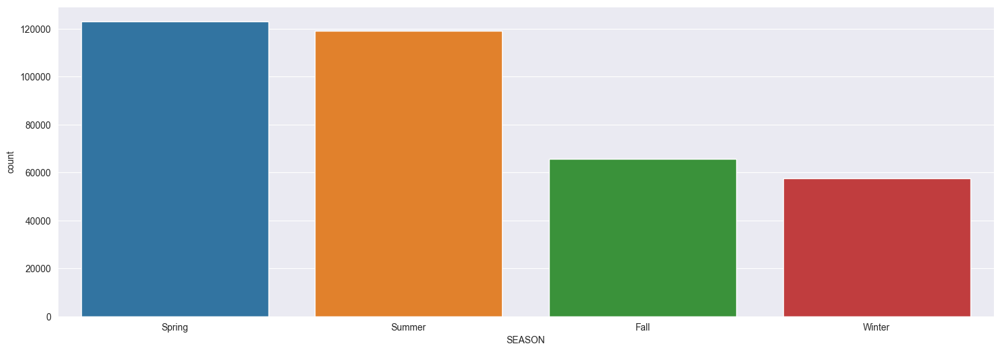

In [13]:
plt.figure(figsize=(18, 6))
sns.countplot(x="SEASON", data=X_train, order=X_train['SEASON'].value_counts().index)

Add TIME_OF_DAY feature:

In [14]:
def generate_time_of_day_column(data_frame):
    # dictionary with the time of the day for each hour
    time_of_day = {0: 'Late Night', 1: 'Late Night', 2: 'Late Night', 3: 'Late Night', 4: 'Night', 5: 'Night',
                   6: 'Night', 7: 'Night', 8: 'Morning', 9: 'Morning', 10: 'Morning', 11: 'Morning', 12: 'Noon',
                   13: 'Noon', 14: 'Noon', 15: 'Noon', 16: 'Afternoon', 17: 'Afternoon', 18: 'Afternoon',
                   19: 'Afternoon', 20: 'Evening', 21: 'Evening', 22: 'Evening', 23: 'Evening'}
    data_frame['TIME_OF_DAY'] = (data_frame['DISCOVERY_TIME'] // 100).astype(int).map(time_of_day)
    return data_frame

In [15]:
X_train = generate_time_of_day_column(X_train)
X_test = generate_time_of_day_column(X_test)
X_val = generate_time_of_day_column(X_val)

Graph showing the number of fires by hour of the

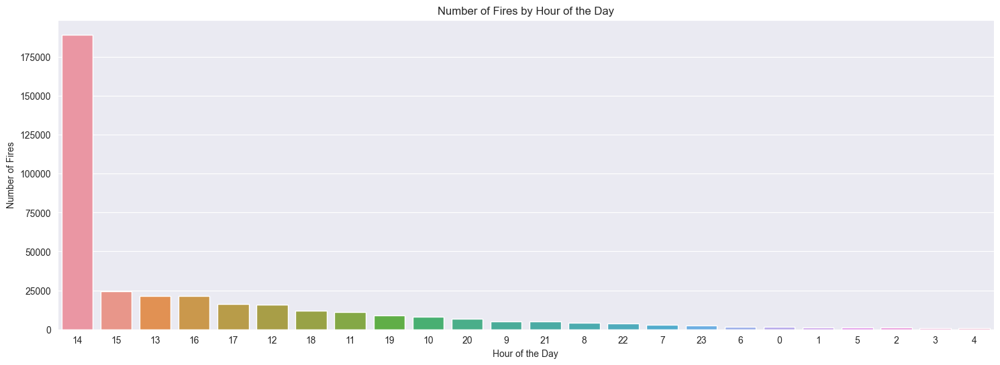

In [16]:
discovery_time_by_24 = (X_train['DISCOVERY_TIME'] // 100).astype(int)

plt.figure(figsize=(18, 6))
sns.countplot(x=discovery_time_by_24, order=discovery_time_by_24.value_counts().index)

plt.title('Number of Fires by Hour of the Day')
plt.xlabel('Hour of the Day')
plt.ylabel('Number of Fires')
plt.show()

Graph showing the number of fires n each time of the day:

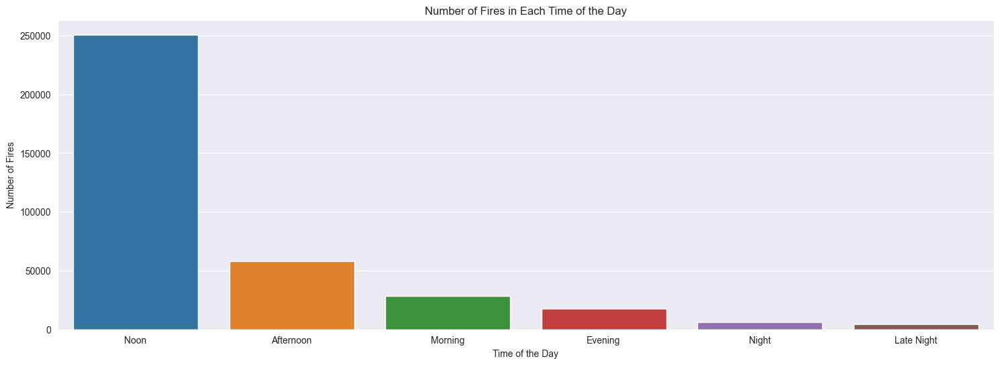

In [17]:
plt.figure(figsize=(18, 6))
sns.countplot(x="TIME_OF_DAY", data=X_train, order=X_train['TIME_OF_DAY'].value_counts().index)
plt.title('Number of Fires in Each Time of the Day')
plt.xlabel('Time of the Day')
plt.ylabel('Number of Fires')
plt.show()

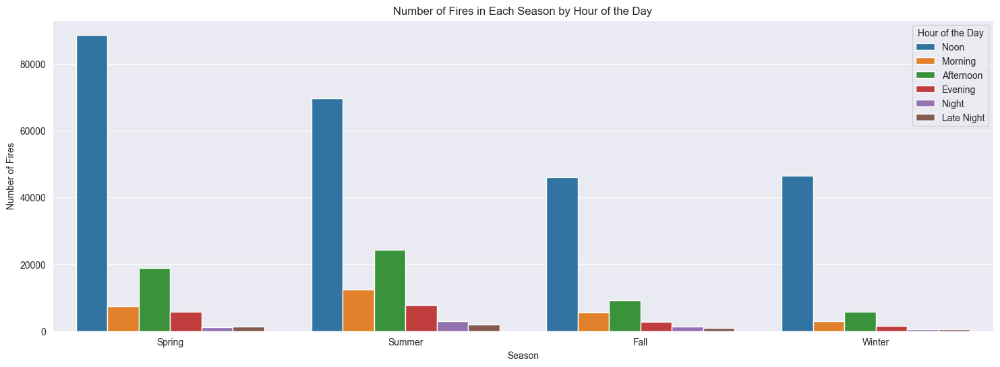

In [18]:
plt.figure(figsize=(18, 6))
sns.countplot(x="SEASON", hue="TIME_OF_DAY", data=X_train,
              order=X_train['SEASON'].value_counts().index)
plt.title('Number of Fires in Each Season by Hour of the Day')
plt.xlabel('Season')
plt.ylabel('Number of Fires')
plt.legend(title='Hour of the Day')
plt.show()

Graph showing the number of cases for each fire cause :

Text(0, 0.5, 'Number of Cases')

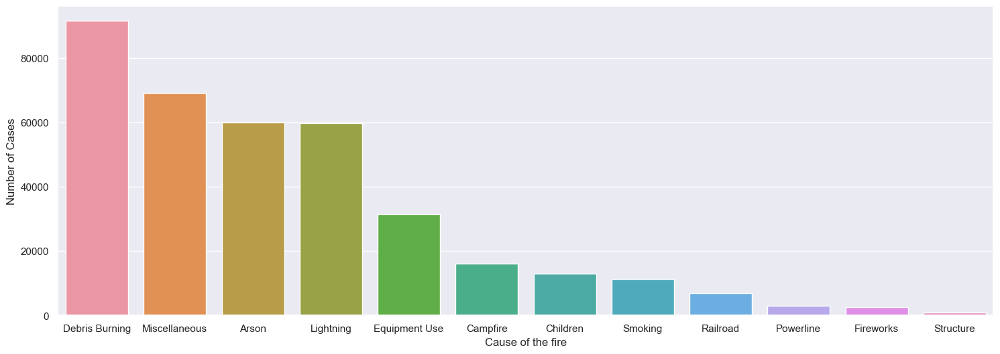

In [19]:
sns.set(style="darkgrid")
plt.figure(figsize=(18, 6))
ax = sns.countplot(x="STAT_CAUSE_DESCR", data=train, order=y_train.value_counts().index)
# add x and y labels
plt.xlabel('Cause of the fire')
plt.ylabel('Number of Cases')

Add holiday feature:

In [20]:
%pip install holidays

def generate_holiday_column(data_frame):
    min_year = data_frame['FIRE_YEAR'].min()
    max_year = data_frame['FIRE_YEAR'].max()

    us_holidays = holidays.US(years=[i for i in range(min_year, max_year + 1)])
    bank_holidays = holidays.NYSE(years=[i for i in range(min_year, max_year + 1)])
    joined_holidays = {**us_holidays, **bank_holidays}

    holidays_data = {
        'day_of_year': [date.timetuple().tm_yday for date in us_holidays.keys()],
        'year': [date.year for date in us_holidays.keys()],
        'holiday': list(us_holidays.values())
    }
    holidays_df = pd.DataFrame(holidays_data)

    data_frame = pd.merge(data_frame, holidays_df, left_on=['FIRE_YEAR', 'DISCOVERY_DOY'], right_on=['year', 'day_of_year'], how='left')
    data_frame = data_frame.drop(['year', 'day_of_year'], axis=1)
    data_frame['holiday'] = data_frame['holiday'].fillna('')
    return data_frame

Note: you may need to restart the kernel to use updated packages.


In [21]:
X_train = generate_holiday_column(X_train)
X_test = generate_holiday_column(X_test)
X_val = generate_holiday_column(X_val)

Graph showing the percentage of fires on each holiday for each cause of fire:

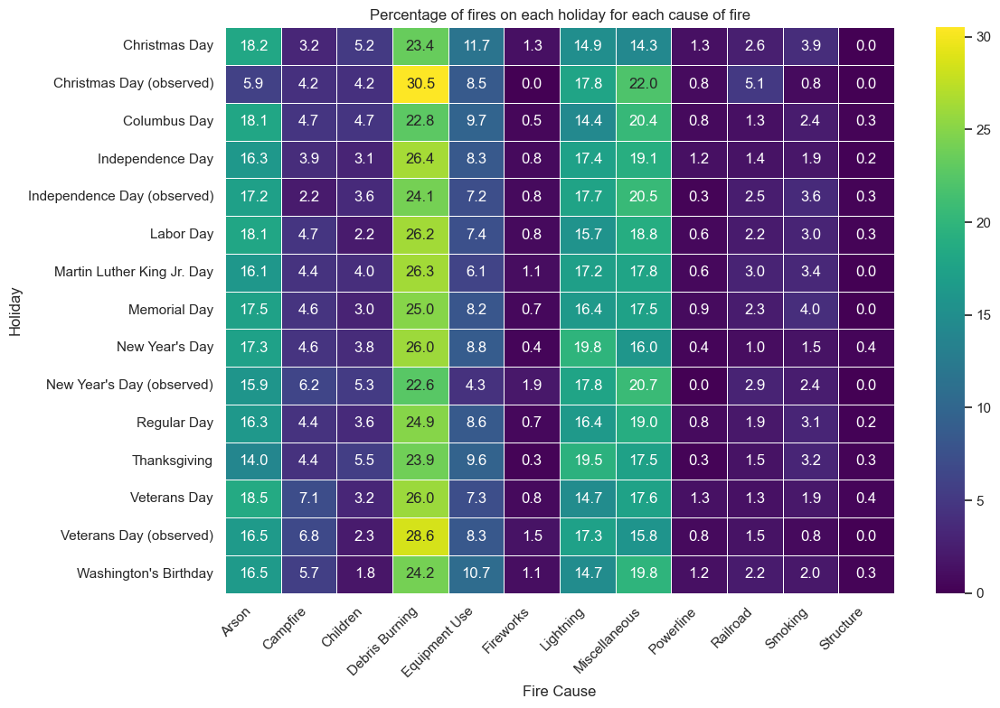

In [22]:
import matplotlib.pyplot as plt
import seaborn as sns
wildfire_data = X_train.copy()
wildfire_data['FIRE_CAUSE'] = y_train
wildfire_data['holiday'] = wildfire_data['holiday'].replace('', 'Regular Day')

grouped_data = wildfire_data.groupby(['holiday', 'FIRE_CAUSE']).size().reset_index(name='count') # Group by 'holiday' and 'FIRE_CAUSE' and calculate the count

grouped_data['percentage'] = grouped_data.groupby('holiday')['count'].transform(lambda x: (x / x.sum()) * 100) # Calculate the percentage of fires from each cause out of all fires on that holiday

grouped_data.loc[grouped_data['holiday'] == '', 'holiday'] = 'Regular Day' # Add 'Regular Day' to the grouped data

pivot_data = grouped_data.pivot(index='holiday', columns='FIRE_CAUSE', values='percentage').fillna(0) # Pivot the data for easier plotting

plt.figure(figsize=(12, 8))
sns.heatmap(pivot_data, cmap='viridis', annot=True, fmt=".1f", linewidths=.5)
plt.title('Percentage of fires on each holiday for each cause of fire')
plt.xlabel('Fire Cause')
plt.ylabel('Holiday')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

In [23]:
# print number of null values in each column
print((X_train.isnull().sum() == 0).all())
print((X_test.isnull().sum() == 0).all())
print((X_val.isnull().sum() == 0).all())

True
True
True


Map that show the number of fires in each location:

In [24]:
center = [X_train['LATITUDE'].mean(), X_train['LONGITUDE'].mean()] # find center of the map
map = folium.Map(location=center, zoom_start=4) # create the map
heat_data = [[row['LATITUDE'], row['LONGITUDE']] for index, row in X_train.iterrows()] # add the heat map
HeatMap(heat_data, radius=10, blur=7).add_to(map)
map

In [25]:
X_train.head(100)

,SOURCE_SYSTEM_TYPE,SOURCE_SYSTEM,NWCG_REPORTING_AGENCY,NWCG_REPORTING_UNIT_ID,NWCG_REPORTING_UNIT_NAME,SOURCE_REPORTING_UNIT,SOURCE_REPORTING_UNIT_NAME,FIRE_CODE,ICS_209_INCIDENT_NUMBER,ICS_209_NAME,...,LONGITUDE,OWNER_CODE,OWNER_DESCR,STATE,COUNTY,FIPS_CODE,FIPS_NAME,SEASON,TIME_OF_DAY,holiday
0,NONFED,ST-NCNCS,ST/C&L,USNCNCS,North Carolina Forest Service,NCNCS309,NCS Region 3 District 9,D44Z,OK-OSA-100020,OSAGE-MIAMI COMPLEX,...,-82.866700,14.0,MISSING/NOT SPECIFIED,NC,5,5.0,Lincoln,Spring,Noon,
1,NONFED,ST-SDSDS,ST/C&L,USSDMURX,Murdo Volunteer Fire Department,SDMURX,Murdo Volunteer Fire Department,D44Z,OK-OSA-100020,OSAGE-MIAMI COMPLEX,...,-100.830040,8.0,PRIVATE,SD,5,5.0,Lincoln,Summer,Noon,
2,NONFED,ST-NASF,ST/C&L,USGAGAS,Georgia Forestry Commission,GAGAS,Georgia Forestry Commission,D44Z,OK-OSA-100020,OSAGE-MIAMI COMPLEX,...,-85.056379,7.0,STATE,GA,Clay,61.0,Clay,Spring,Noon,
3,NONFED,ST-NASF,ST/C&L,USMNMNS,Minnesota Department of Natural Resources,MNMNS,Minnesota Department of Natural Resources,D44Z,OK-OSA-100020,OSAGE-MIAMI COMPLEX,...,-93.996576,14.0,MISSING/NOT SPECIFIED,MN,Morrison,97.0,Morrison,Spring,Noon,
4,NONFED,ST-ALALS,ST/C&L,USALALS,Alabama Forestry Commission,ALALS,Alabama Forestry Commission,D44Z,OK-OSA-100020,OSAGE-MIAMI COMPLEX,...,-88.304400,14.0,MISSING/NOT SPECIFIED,AL,WA,129.0,Washington,Spring,Noon,
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,NONFED,ST-NASF,ST/C&L,USNCNCS,North Carolina Forest Service,NCNCS,North Carolina Division of Forest Resources,D44Z,OK-OSA-100020,OSAGE-MIAMI COMPLEX,...,-76.840480,14.0,MISSING/NOT SPECIFIED,NC,Carteret,31.0,Carteret,Spring,Noon,
96,FED,FS-FIRESTAT,FS,USWAOWF,Okanogan/Wenatchee National Forest,0617,Wenatchee National Forest,G9MD,OK-OSA-100020,OSAGE-MIAMI COMPLEX,...,-121.409167,5.0,USFS,WA,077,77.0,Yakima,Fall,Noon,
97,NONFED,ST-TXTXS,ST/C&L,USTXTXS,Texas A & M Forest Service,TXVFD,Lake Arrowhead VFD,D44Z,OK-OSA-100020,OSAGE-MIAMI COMPLEX,...,-98.334270,13.0,STATE OR PRIVATE,TX,Clay,77.0,Clay,Summer,Noon,
98,NONFED,ST-NASF,ST/C&L,USCABTU,Butte Unit,CABTU,Butte Unit,D44Z,OK-OSA-100020,OSAGE-MIAMI COMPLEX,...,-121.581750,14.0,MISSING/NOT SPECIFIED,CA,BUTTE,7.0,Butte,Winter,Noon,


# Correlation

Checing correlation between categorical features:

In [26]:
categorical_features = ['SOURCE_SYSTEM_TYPE', 'SOURCE_SYSTEM', 'NWCG_REPORTING_AGENCY', 'NWCG_REPORTING_UNIT_ID',
                        'NWCG_REPORTING_UNIT_NAME', 'SOURCE_REPORTING_UNIT_NAME','SOURCE_REPORTING_UNIT', 'ICS_209_INCIDENT_NUMBER',
                        'ICS_209_NAME', 'MTBS_ID', 'MTBS_FIRE_NAME', 'COMPLEX_NAME', 'FIRE_SIZE_CLASS',
                        'OWNER_CODE', 'OWNER_DESCR', 'STATE', 'COUNTY', 'FIPS_CODE', 'STAT_CAUSE_DESCR',
                        'TIME_OF_DAY', 'SEASON','holiday','FIRE_CODE','FIPS_NAME']

<Axes: >

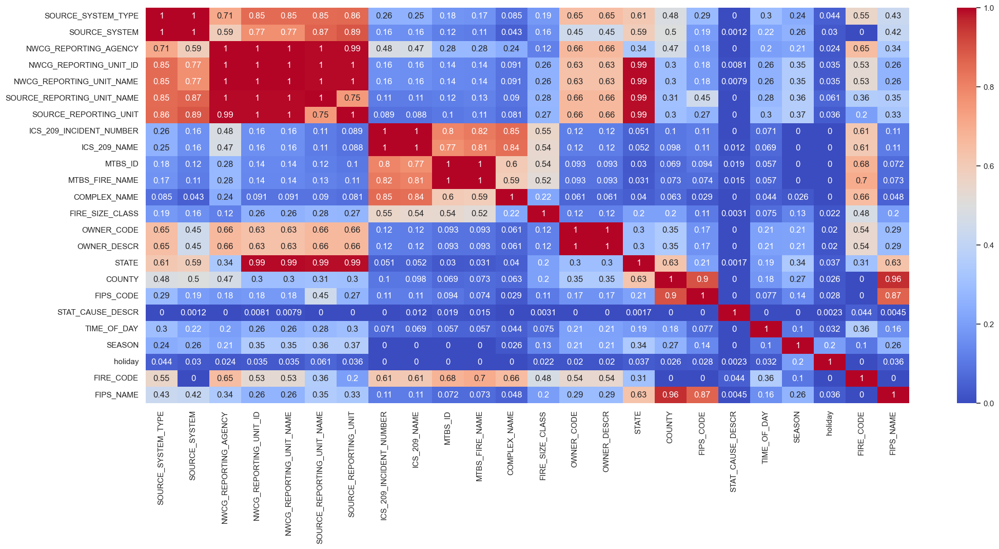

In [27]:
def cramers_v(confusion_matrix):
    chi2 = ss.chi2_contingency(confusion_matrix)[0]
    n = confusion_matrix.sum()
    phi2 = chi2 / n
    r, k = confusion_matrix.shape
    phi2corr = max(0, phi2 - ((k - 1) * (r - 1)) / (n - 1))
    rcorr = r - ((r - 1) ** 2) / (n - 1)
    kcorr = k - ((k - 1) ** 2) / (n - 1)
    return np.sqrt(phi2corr / min((kcorr - 1), (rcorr - 1)))


categorical_df = X_train.copy()
categorical_df['STAT_CAUSE_DESCR'] = y_train
categorical_df = categorical_df[categorical_features] # add the train y to the categorical df v

#encode the data using label encoding, and then calculate the correlation between the features using cramers v
label_encoder = LabelEncoder()
categorical_df_encoded = categorical_df.apply(label_encoder.fit_transform)
categorical_df_encoded = categorical_df_encoded.astype('int64')

# calculate the correlation between the features
categorical_features_corr = np.zeros((len(categorical_features), len(categorical_features)))
for i in range(len(categorical_features)):
    for j in range(len(categorical_features)):
        confusion_matrix = pd.crosstab(categorical_df_encoded[categorical_features[i]],
                                       categorical_df_encoded[categorical_features[j]]).values
        categorical_features_corr[i, j] = cramers_v(confusion_matrix)

# create a dataframe with the correlation between the features
categorical_features_corr_df = pd.DataFrame(categorical_features_corr, columns=categorical_features,
                                            index=categorical_features)

# plot the correlation between the features, show the values in the cells
plt.figure(figsize=(24, 10))
sns.heatmap(categorical_features_corr_df, annot=True, cmap='coolwarm')

Separation between the features that we remove following the correlation result and those that do not:

In [28]:
# create a dictionary where the key is the feature and the value is a list containing the names of features that are
# highly correlated with the key feature (0.8 and above) without the feature itself
highly_correlated_features = {}
for i in range(len(categorical_features)):
    for j in range(len(categorical_features)):
        if i != j and categorical_features_corr[i, j] >= 0.79:
            highly_correlated_features[categorical_features[i]] = highly_correlated_features.get(
                categorical_features[i], []) + [categorical_features[j]]
# get the names of the features that arnt keys in highly_correlated_features
categorical_features_to_keep = [feature for feature in categorical_features if feature not in highly_correlated_features]
# while highly_correlated_features is not empty, choose the feature with the most highly correlated features and remove
# each of the highly correlated features from the dictionary. Add the chosen feature to the list of feature to keep.
while highly_correlated_features:
    max_correlation = 0
    max_correlation_feature = None
    for feature, correlated_features in highly_correlated_features.items():
        if len(correlated_features) > max_correlation:
            max_correlation = len(correlated_features)
            max_correlation_feature = feature
    categorical_features_to_keep.append(max_correlation_feature)
    for feature in highly_correlated_features[max_correlation_feature]:
        if feature in highly_correlated_features:
            del highly_correlated_features[feature]
    del highly_correlated_features[max_correlation_feature]
categorical_features_to_keep

['FIRE_SIZE_CLASS',
 'STAT_CAUSE_DESCR',
 'TIME_OF_DAY',
 'SEASON',
 'holiday',
 'FIRE_CODE',
 'NWCG_REPORTING_UNIT_ID',
 'ICS_209_INCIDENT_NUMBER',
 'SOURCE_SYSTEM',
 'COUNTY',
 'OWNER_CODE']

Correlation between the categorical features we choose to keep:

<Axes: >

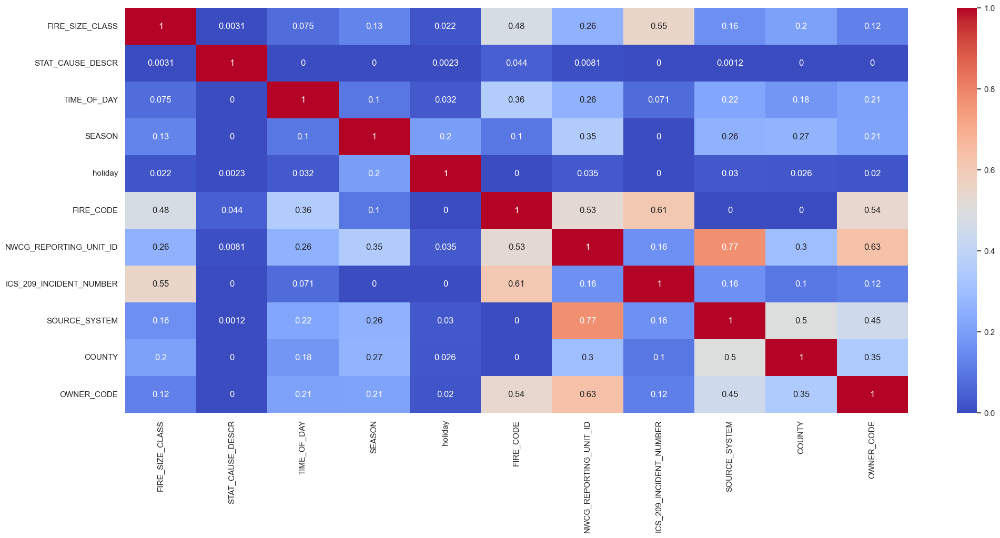

In [29]:
categorical_features_corr_df = categorical_features_corr_df.loc[categorical_features_to_keep, categorical_features_to_keep] # drop the features that are not in the features_to_keep list
plt.figure(figsize=(24, 10))
sns.heatmap(categorical_features_corr_df, annot=True, cmap='coolwarm')

Correlation between numerical features:

<Axes: >

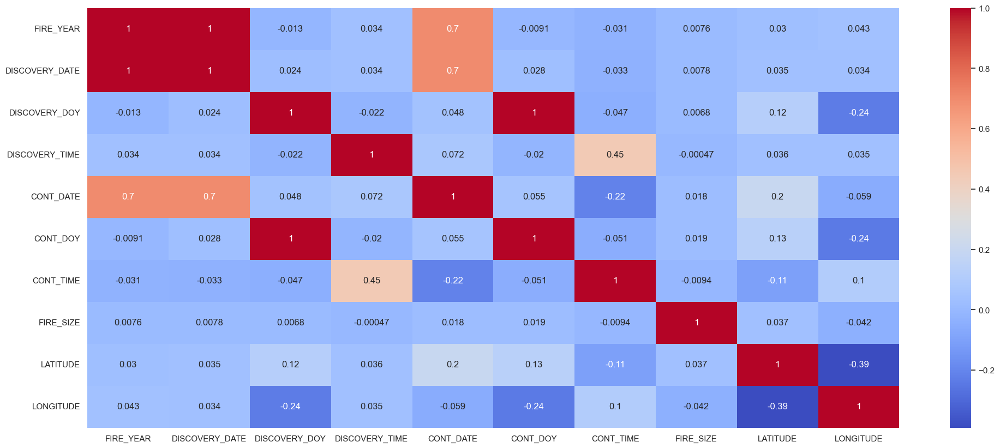

In [30]:
numerical_features_to_keep = [feature for feature in X_train.columns.tolist() if feature not in categorical_features]
numerical_features_corr = X_train[numerical_features_to_keep].corr()

plt.figure(figsize=(24, 10))
sns.heatmap(numerical_features_corr, annot=True, cmap='coolwarm')

we can see that the only columns with correlation higher than 0.8 are: FIRE_YEAR, DISCOVERY_DATE, CONT_DATE.
we got here a triangle of correlation between the 3 columns and the correlation of each pair is 1,
so we can drop 2 of them and keep only one.

                                            DISCOVERY_DATE
                                             /          \
                                        CONT_DATE -- FIRE_YEAR
                             
we choose to keep FIRE_YEAR and drop the other 2 columns.

In [31]:
if 'CONT_DATE' in numerical_features_to_keep:
    numerical_features_to_keep.remove('CONT_DATE')
if 'DISCOVERY_DATE' in numerical_features_to_keep:
    numerical_features_to_keep.remove('DISCOVERY_DATE')

Correlation between the numerical and categorical features:

<Axes: >

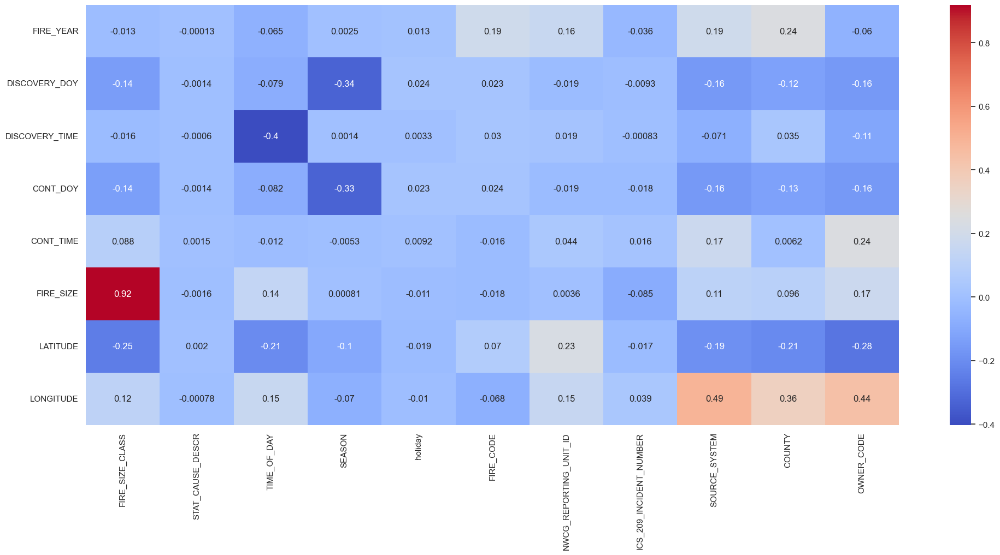

In [32]:
numerical_categorical_corr = np.zeros((len(numerical_features_to_keep), len(categorical_features_to_keep)))
for i in range(len(numerical_features_to_keep)):
    for j in range(len(categorical_features_to_keep)):
        spearman_corr, _ = spearmanr(X_train[numerical_features_to_keep[i]], categorical_df_encoded[categorical_features_to_keep[j]])
        numerical_categorical_corr[i, j] = spearman_corr

numerical_categorical_corr_df = pd.DataFrame(numerical_categorical_corr, columns=categorical_features_to_keep,
                                             index=numerical_features_to_keep)
plt.figure(figsize=(24, 10))
sns.heatmap(numerical_categorical_corr_df, annot=True, cmap='coolwarm')

We can see that fire size class and fire size are highly correlated, we can drop one of them.
we choose to drop fire size class.

In [33]:
features_to_keep = numerical_features_to_keep + categorical_features_to_keep

In [34]:
if 'FIRE_SIZE_CLASS' in features_to_keep:
    features_to_keep.remove('FIRE_SIZE_CLASS')
    categorical_features_to_keep.remove('FIRE_SIZE_CLASS')

In [35]:
# Remove the labels
if 'STAT_CAUSE_DESCR' in features_to_keep:
    features_to_keep.remove('STAT_CAUSE_DESCR')
    categorical_features_to_keep.remove('STAT_CAUSE_DESCR')

Update the features to be the feature we decided to keep:

In [36]:
X_train = X_train[features_to_keep]
X_test = X_test[features_to_keep]
X_val = X_val[features_to_keep]

Handling Categorical features:

In [37]:
def one_hot(train_df, test_df, val_df, column_name, prefix=None):
    onehot_encoder = OneHotEncoder(handle_unknown='ignore')

    column_data_train = train_df[[column_name]]
    onehot_encoder.fit(column_data_train)

    for df in [train_df, test_df, val_df]:
        column_data = df[[column_name]]
        new_columns = onehot_encoder.transform(column_data)
        new_column_names = [prefix + str(category) for category in onehot_encoder.categories_[0]]
        new_columns_df = pd.DataFrame(new_columns.toarray(), columns=new_column_names, index=df.index)
        df[new_column_names] = new_columns_df
        df.drop(columns=[column_name], inplace=True)

    return train_df, test_df, val_df

In [38]:
# frequency encoding for ICS_209_INCIDENT_NUMBER, NWCG_REPORTING_UNIT_ID, COUNTY, FIRE_CODE
frequency_encoding_columns = ['ICS_209_INCIDENT_NUMBER', 'NWCG_REPORTING_UNIT_ID', 'COUNTY', 'FIRE_CODE']
for column in frequency_encoding_columns:
    frequency_map = X_train[column].value_counts(normalize=True)
    X_train[column] = X_train[column].map(frequency_map)
    X_test[column] = X_test[column].map(frequency_map)
    X_val[column] = X_val[column].map(frequency_map)

X_test.fillna(0, inplace=True)
X_val.fillna(0, inplace=True)


# use one hot encoding for the rest of the categorical features
for feature in categorical_features_to_keep :
    if feature not in frequency_encoding_columns:
        X_train, X_test, X_val = one_hot(X_train, X_test, X_val, feature, prefix=feature + '_')

# Model Selection

Encode the labels before training the models:

In [39]:
label_encoder = LabelEncoder()
y_train_encoded = label_encoder.fit_transform(y_train)
y_val_encoded = label_encoder.transform(y_val)

ROC graph creator:

In [40]:
def roc_graph_for_models(model_name, y_true, y_pred_proba):
    n_classes = y_pred_proba.shape[1]
    fpr = dict()
    tpr = dict()
    roc_auc = dict()

    class_names = label_encoder.classes_
    
    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve((y_true == i).astype(int), y_pred_proba[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    plt.figure(figsize=(10, 8))
    colors = ['red', 'blue', 'green', 'orange', 'purple', 'yellow', 'cyan', 'magenta', 'lime', 'pink', 'teal',
              'lavender']
    for i, color in zip(range(n_classes), colors):
        plt.plot(fpr[i], tpr[i], color=color, lw=2,
                 label='ROC curve of class {} (area = {:.2f})'.format(class_names[i], roc_auc[i]))

    plt.plot([0, 1], [0, 1], 'k--', lw=2)
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve - {}'.format(model_name))
    plt.legend(loc="lower right")
    plt.show()

Baseline model

In [41]:
def create_baseline_model():
  scaler = StandardScaler()
  X_train_scaled = scaler.fit_transform(X_train.select_dtypes(exclude=['object']))
  X_val_scaled = scaler.transform( X_val.select_dtypes(exclude=['object']))
  baseline_model = LogisticRegression(max_iter=1000)
  baseline_model.fit(X_train_scaled, y_train)
  y_pred = baseline_model.predict(X_val_scaled)
  y_pred_proba = baseline_model.predict_proba(X_val_scaled)
  report = classification_report(y_val, y_pred, zero_division=0)
  return report, y_pred_proba

In [42]:
report, y_pred_proba = create_baseline_model()
print(report)

                precision    recall  f1-score   support

         Arson       0.41      0.31      0.35     14822
      Campfire       0.38      0.07      0.12      4129
      Children       0.15      0.00      0.00      3223
Debris Burning       0.42      0.71      0.53     22922
 Equipment Use       0.37      0.12      0.18      8032
     Fireworks       0.40      0.20      0.26       581
     Lightning       0.57      0.76      0.65     14762
 Miscellaneous       0.38      0.37      0.38     17365
     Powerline       0.00      0.00      0.00       755
      Railroad       0.40      0.38      0.39      1842
       Smoking       0.15      0.00      0.00      2788
     Structure       0.00      0.00      0.00       207

      accuracy                           0.44     91428
     macro avg       0.30      0.24      0.24     91428
  weighted avg       0.41      0.44      0.40     91428



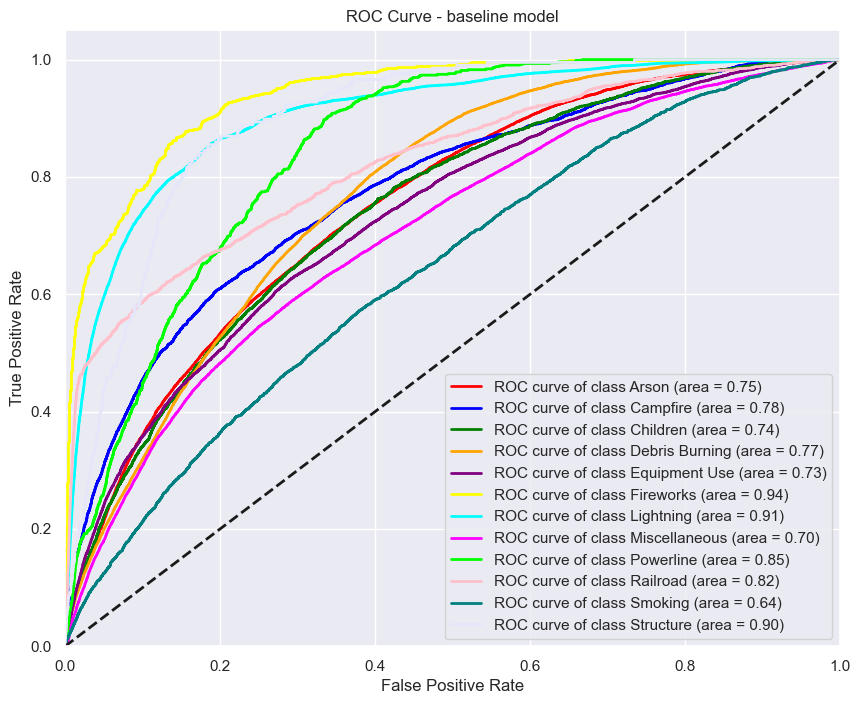

In [43]:
roc_auc = roc_graph_for_models("baseline model", y_val_encoded, y_pred_proba)

Trying Different Models

In [44]:
def compare_models(models, y_train_encoded, y_val_encoded):
    # this function will get a dictionary of models and their names, and will return a dictionary with the auc value for each model
    auc_vals_dict = {}
    for model_name, model in models.items():
        model.fit(X_train, y_train_encoded)
        y_pred_proba = model.predict_proba(X_val)
        auc_vals_dict[model_name] = roc_auc_score(y_val_encoded, y_pred_proba, multi_class='ovr')
        # create graph for each model
        roc_graph_for_models(model_name, y_val_encoded, y_pred_proba)
    return auc_vals_dict

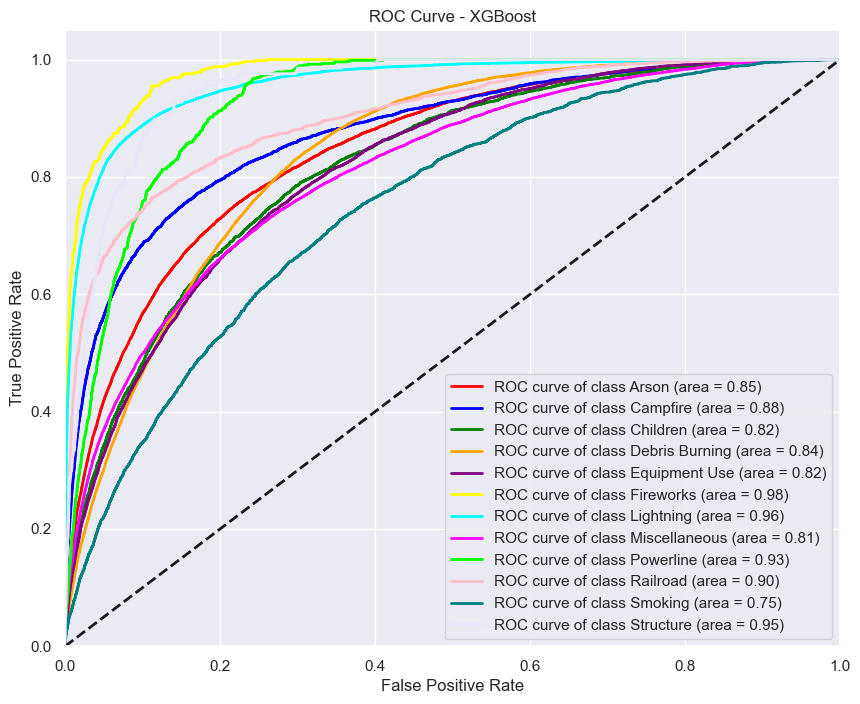

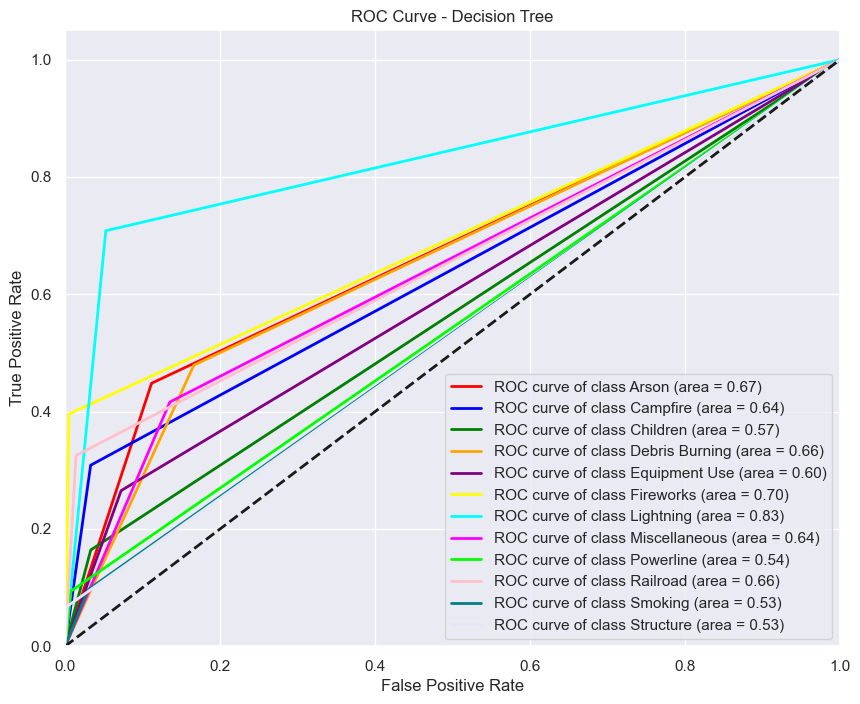

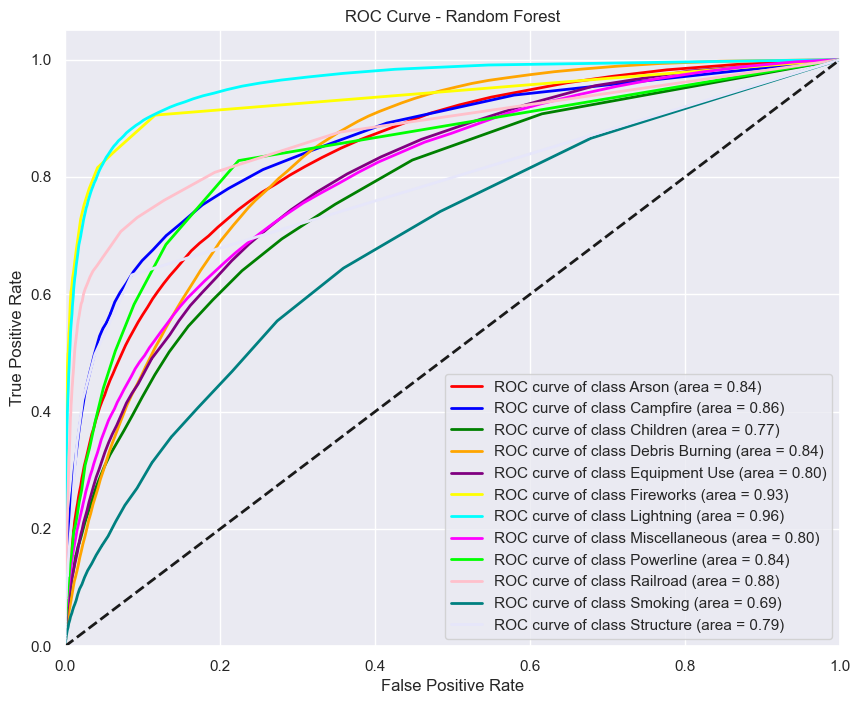

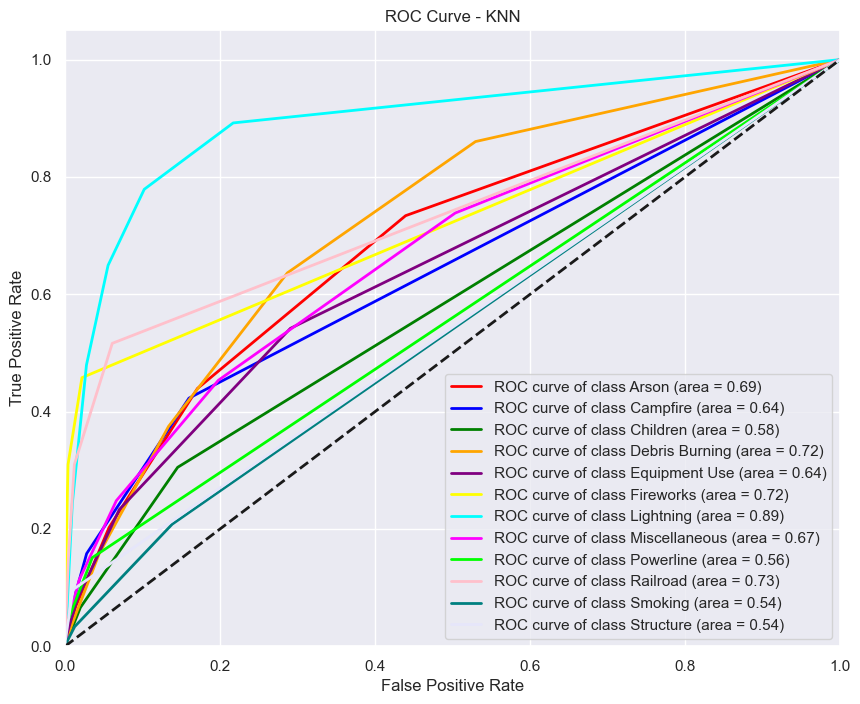

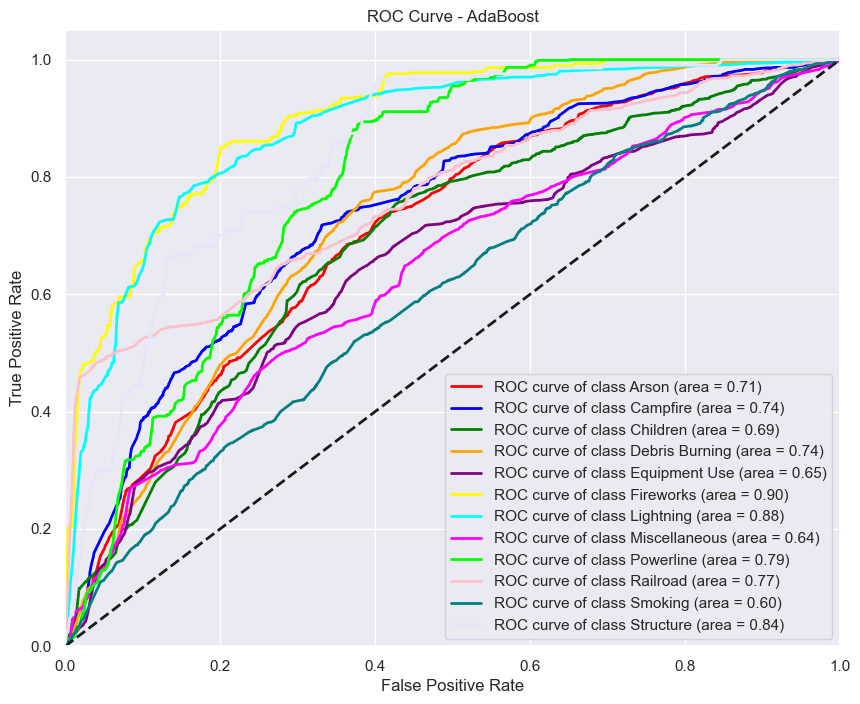

In [45]:
# XGBoost model
xgb_model = xgb.XGBClassifier()

# random forest model
rf_model = RandomForestClassifier()

# decision tree model
dt_model = DecisionTreeClassifier()

#KNN model
knn_model = KNeighborsClassifier()

# adaboost decision tree model
weak_learner = DecisionTreeClassifier(max_depth=1)
n_estimators = 100
adaboost_clf_dt = AdaBoostClassifier(
    estimator=weak_learner,
    n_estimators=n_estimators,
    algorithm="SAMME",
    random_state=42,
)

models = {
    'XGBoost': xgb_model,
    'Decision Tree': dt_model,
    'Random Forest': rf_model,
    'KNN': knn_model,
    'AdaBoost': adaboost_clf_dt
}
auc_vals_dict = compare_models(models, y_train_encoded, y_val_encoded)

In [46]:
auc_vals_dict

{'XGBoost': 0.8740386155515822,
 'Decision Tree': 0.6294648195886406,
 'Random Forest': 0.8330824611249849,
 'KNN': 0.6607338248369555,
 'AdaBoost': 0.7462058231378245}

we can see that the best model is the XGBoost model, we will use it for the next steps.

classification report for each model:

In [47]:
for model_name, model in models.items():
    y_pred = model.predict(X_val)
    report = classification_report(y_val_encoded, y_pred, zero_division=0)
    print(f'{model_name} classification report:')
    print(report)

XGBoost classification report:
              precision    recall  f1-score   support

           0       0.55      0.49      0.52     14822
           1       0.51      0.33      0.40      4129
           2       0.40      0.09      0.15      3223
           3       0.50      0.75      0.60     22922
           4       0.44      0.23      0.30      8032
           5       0.51      0.48      0.49       581
           6       0.73      0.83      0.78     14762
           7       0.51      0.52      0.51     17365
           8       0.38      0.03      0.05       755
           9       0.48      0.38      0.42      1842
          10       0.38      0.01      0.03      2788
          11       0.21      0.02      0.04       207

    accuracy                           0.55     91428
   macro avg       0.47      0.35      0.36     91428
weighted avg       0.54      0.55      0.52     91428

Decision Tree classification report:
              precision    recall  f1-score   support

          

# Optimization

In [48]:
# use optuna to find the best hyperparameters for the XGBoost model
# we want to maximize the auc score

def objective(trial):
    xgb_params = {
        'n_estimators': trial.suggest_int('n_estimators', 50, 200),
        'max_depth': trial.suggest_int('max_depth', 3, 10),
        'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 1),
        'subsample': trial.suggest_loguniform('subsample', 0.5, 1),
        'gamma': trial.suggest_loguniform('gamma', 0.01, 1),
        'min_child_weight': trial.suggest_int('min_child_weight', 1, 10),
        'objective': 'multi:softmax',
        'num_class': len(label_encoder.classes_),
    }
    xgb_model = xgb.XGBClassifier(**xgb_params)
    return cross_val_score(xgb_model, X_train, y_train_encoded, n_jobs=-1, cv=3,
                           scoring=make_scorer(roc_auc_score, needs_proba=True, multi_class='ovr')).mean()

# sampler = TPESampler(seed=42)
# study = optuna.create_study(direction='maximize', sampler=sampler)
# study.optimize(objective, n_trials=100)

after running the optuna we got the best hyperparameters for the XGBoost model:
 * 'n_estimators': 156, 'max_depth': 9
 * 'learning_rate': 0.11236596365407153 
 * 'subsample': 0.8925920206669298
 * 'gamma': 0.0605871121329831 
 * 'min_child_weight': 5

In [49]:
# train the model with the best hyperparameters
best_params = {'n_estimators': 156, 'max_depth': 9, 'learning_rate': 0.11236596365407153,
               'subsample': 0.8925920206669298, 'gamma': 0.0605871121329831, 'min_child_weight': 5}

best_xgb_model = xgb.XGBClassifier(**best_params)
best_xgb_model.fit(X_train, y_train_encoded)

y_pred_proba = best_xgb_model.predict_proba(X_val)
roc_auc_score(y_val_encoded, y_pred_proba, multi_class='ovr')


0.8800003881248207

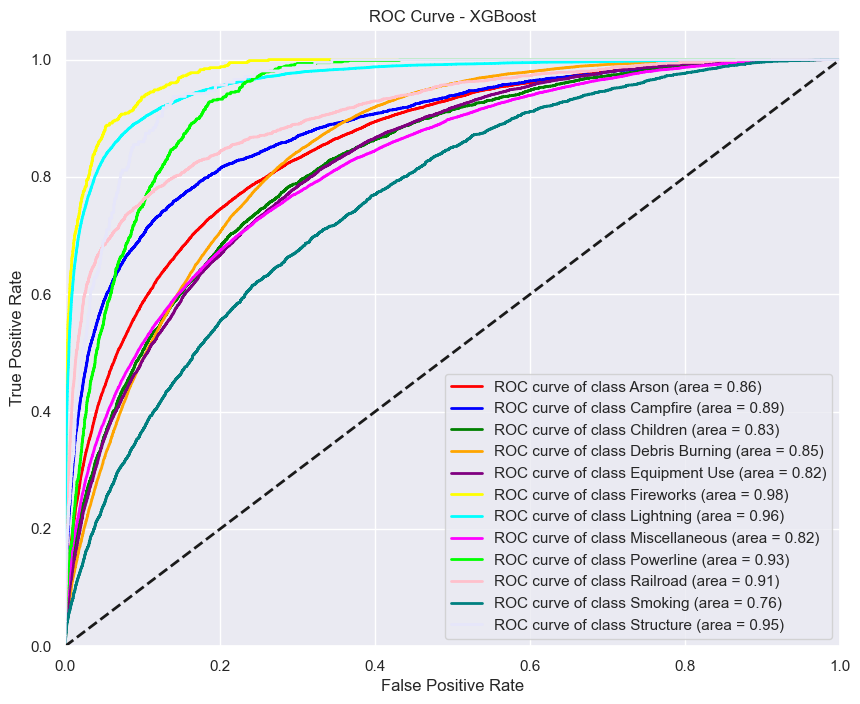

In [50]:
# graph the roc curve for the best model
roc_graph_for_models('XGBoost', y_val_encoded, y_pred_proba)

In [51]:
# get classification report for the best model
y_pred = best_xgb_model.predict(X_val)
# print accuracy
report = classification_report(y_val_encoded, y_pred, zero_division=0)
print(report)

              precision    recall  f1-score   support

           0       0.57      0.51      0.54     14822
           1       0.53      0.36      0.43      4129
           2       0.41      0.10      0.15      3223
           3       0.51      0.75      0.61     22922
           4       0.44      0.26      0.32      8032
           5       0.52      0.50      0.51       581
           6       0.75      0.84      0.79     14762
           7       0.53      0.53      0.53     17365
           8       0.34      0.05      0.09       755
           9       0.50      0.38      0.43      1842
          10       0.32      0.02      0.03      2788
          11       0.21      0.02      0.04       207

    accuracy                           0.56     91428
   macro avg       0.47      0.36      0.37     91428
weighted avg       0.54      0.56      0.53     91428



## Ensemble and Boosting

In [52]:
# use ensemble method to improv the model auc result 
voting_model = VotingClassifier(estimators=[('xgb', best_xgb_model), ('rf', rf_model), ('dt', dt_model), ('knn', knn_model)],
                                voting='soft')
voting_model.fit(X_train, y_train_encoded)
y_pred_proba = voting_model.predict_proba(X_val)
roc_auc_score(y_val_encoded, y_pred_proba, multi_class='ovr')

0.8571230208856478

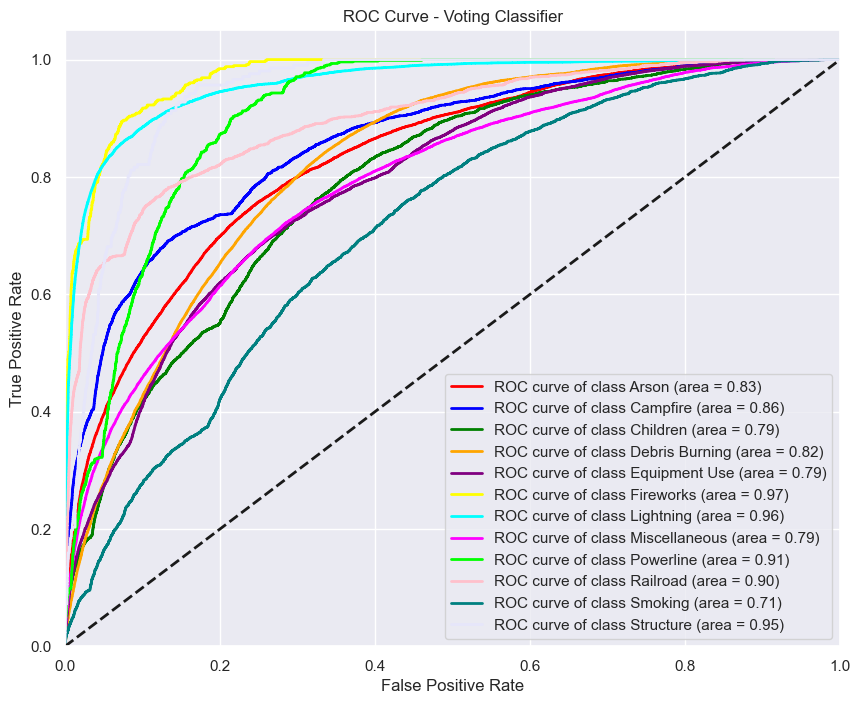

In [53]:
# add a graph for the voting model
roc_graph_for_models('Voting Classifier', y_val_encoded, y_pred_proba)

In [54]:
# SAMME algorithm adaboost
weak_learner = xgb.XGBClassifier(**best_params)
n_estimators = 100

adaboost_clf = AdaBoostClassifier(
    estimator=weak_learner,
    n_estimators=n_estimators,
    algorithm="SAMME",
    random_state=42,
).fit(X_train, y_train_encoded)
y_pred_proba = adaboost_clf.predict_proba(X_val)
roc_auc_score(y_val_encoded, y_pred_proba, multi_class='ovr')

0.5

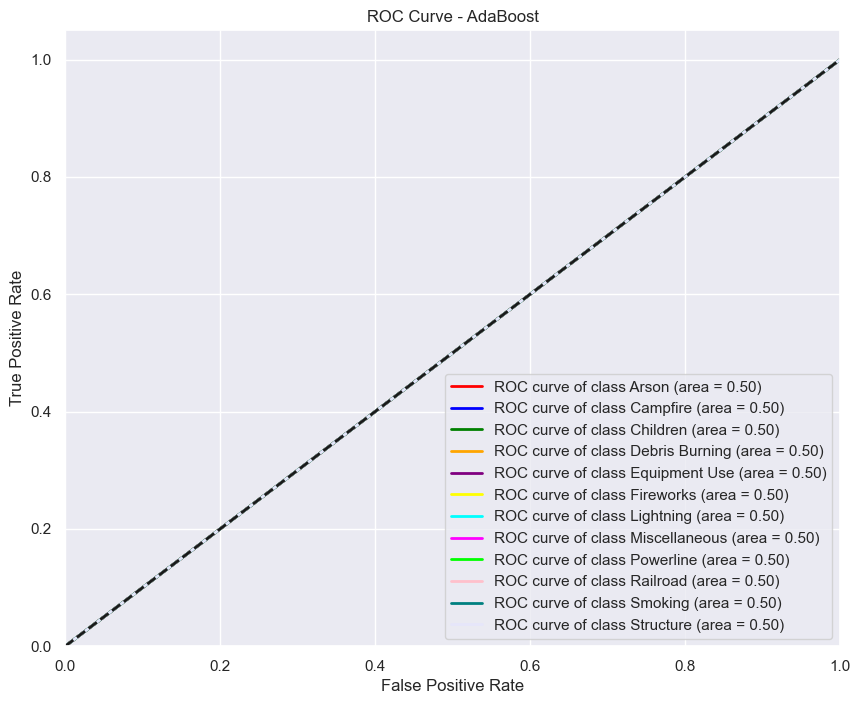

In [55]:
# add a graph for the adaboost model
roc_graph_for_models('AdaBoost', y_val_encoded, y_pred_proba)

In [56]:
# first we will get a list of all the features that we removed
# than we will iterate over them and for each numeric feature we will add it to data and check the auc score
removed_features = [feature for feature in starting_features if feature not in features_to_keep]
print("total number of removed features: ", len(removed_features))
print()
print("results for each feature:")
for feature in removed_features:
    if is_numeric_dtype(original_X_train[feature]):
        X_train[feature] = original_X_train[feature]
        X_val[feature] = original_X_val[feature]
        best_xgb_model.fit(X_train, y_train_encoded)
        y_pred_proba = best_xgb_model.predict_proba(X_val)
        print(f'{feature}: {roc_auc_score(y_val_encoded, y_pred_proba, multi_class="ovr")}')
        # remove the feature from the data
        X_train.drop(columns=[feature], inplace=True)
        X_val.drop(columns=[feature], inplace=True)
    else:
        # frequency encoding 
        frequency_map = original_X_train[feature].value_counts(normalize=True)
        X_train[feature] = original_X_train[feature].map(frequency_map)
        X_val[feature] = original_X_val[feature].map(frequency_map)

        best_xgb_model.fit(X_train, y_train_encoded)
        y_pred_proba = best_xgb_model.predict_proba(X_val)
        print(f'{feature}: {roc_auc_score(y_val_encoded, y_pred_proba, multi_class="ovr")}')
        # remove the feature from the data
        X_train.drop(columns=[feature], inplace=True)
        X_val.drop(columns=[feature], inplace=True)

total number of removed features:  16

results for each feature:
SOURCE_SYSTEM_TYPE: 0.8798121472050408
NWCG_REPORTING_AGENCY: 0.8797980843796034
NWCG_REPORTING_UNIT_NAME: 0.8792178609538528
SOURCE_REPORTING_UNIT: 0.879023169157814
SOURCE_REPORTING_UNIT_NAME: 0.8790354737568675
ICS_209_NAME: 0.8799874477686096
MTBS_ID: 0.8800675051597792
MTBS_FIRE_NAME: 0.8798996578008934
COMPLEX_NAME: 0.880069644404383
DISCOVERY_DATE: 0.8791358394885274
CONT_DATE: 0.8792015837272413
FIRE_SIZE_CLASS: 0.8795507065448707
OWNER_DESCR: 0.8797577469301995
STATE: 0.8796116500288952
FIPS_CODE: 0.8791539755781965
FIPS_NAME: 0.8792826125451421


## Feature *Evaluation*

In [57]:
def train_and_evaluate(features):
    X_train_selected = X_train[features]
    X_val_selected = X_val[features]
    model = xgb.XGBClassifier(**best_params)
    model.fit(X_train_selected, y_train_encoded)
    y_pred_proba = model.predict_proba(X_val_selected)
    auc_res = roc_auc_score(y_val_encoded, y_pred_proba, multi_class='ovr')
    return auc_res

In [58]:
def get_sorted_importances(model, importance_type, N=10):
    importances = model.get_booster().get_score(importance_type=importance_type)
    sorted_importances = sorted(importances.items(), key=lambda x: x[1], reverse=True)
    top_features = [feature for feature, _ in sorted_importances[:N]]
    return top_features

In [59]:
xgb_model = xgb.XGBClassifier(**best_params)
xgb_model.fit(X_train, y_train_encoded)
y_pred_proba = xgb_model.predict_proba(X_val)
print("Initial Model AUC:", roc_auc_score(y_val_encoded, y_pred_proba, multi_class='ovr'))

Initial Model AUC: 0.8800003881248207


In [60]:
importance_types = ['gain', 'weight', 'cover']
model_aucs = {}

for imp_type in importance_types:
    top_features = get_sorted_importances(xgb_model, imp_type)
    auc_t_e_res = train_and_evaluate(top_features)
    model_aucs[f"{imp_type}_model_auc"] = auc_t_e_res
    print(f"AUC for model trained with top 10 features by {imp_type}: {auc_t_e_res}")

AUC for model trained with top 10 features by gain: 0.7238531630854497
AUC for model trained with top 10 features by weight: 0.8747828873161536
AUC for model trained with top 10 features by cover: 0.5333646259961162


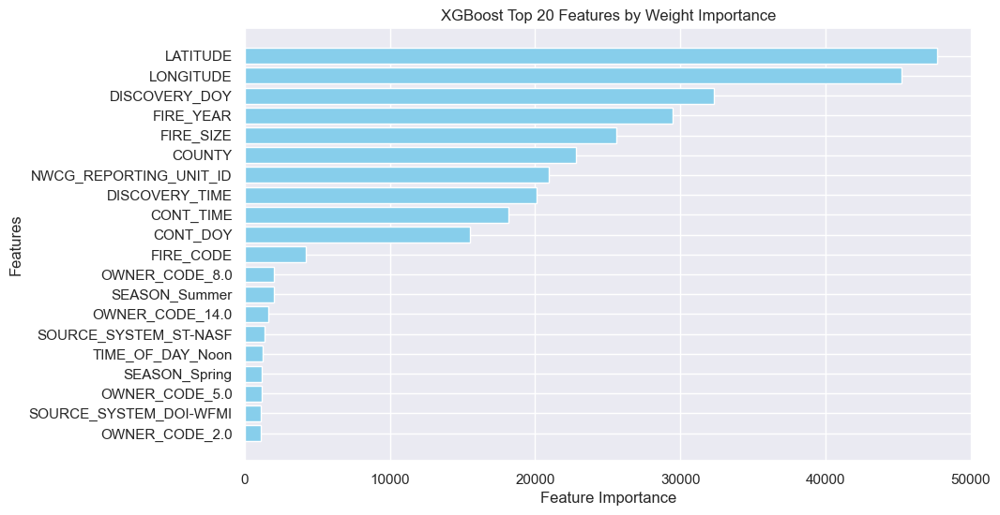

In [61]:
importances = xgb_model.get_booster().get_score(importance_type="weight")
sorted_importances = sorted(importances.items(), key=lambda x: x[1], reverse=True)[:20]
features, importances = zip(*sorted_importances)  # This unpacks the list of tuples into two tuples

plt.figure(figsize=(10, 6))
plt.barh(features, importances, color='skyblue')
plt.xlabel('Feature Importance')
plt.ylabel('Features')
plt.title('XGBoost Top 20 Features by Weight Importance')
plt.gca().invert_yaxis()  # Invert the y-axis to have the most important feature on top
plt.show()

In [62]:
# store the max result and N 
max_result = 0
max_N = 0
for N in range(60,10,-10):
    top_features = get_sorted_importances(xgb_model, "weight", N)
    auc_t_e_res = train_and_evaluate(top_features)
    print(f"AUC for model with {N} features: {auc_t_e_res}")
    if auc_t_e_res > max_result:
        max_result = auc_t_e_res
        max_N = N
print(f"Max AUC: {max_result} with N={max_N}")

AUC for model with 60 features: 0.8801960514908834
AUC for model with 50 features: 0.8809149963420957
AUC for model with 40 features: 0.8810023280319266
AUC for model with 30 features: 0.880559757056563
AUC for model with 20 features: 0.880368790326482
Max AUC: 0.8810023280319266 with N=40


using the top 40 features we got the best result.
we will now use those to make our final model less complex.

In [63]:
# keep only the top N features
top_features = get_sorted_importances(xgb_model, "weight", max_N)
X_train = X_train[top_features]
X_val = X_val[top_features]
X_test = X_test[top_features]

### Final Model

In [64]:
final_model = xgb.XGBClassifier(**best_params)
final_model.fit(X_train, y_train_encoded)
y_pred_proba = final_model.predict_proba(X_val)
roc_auc_score(y_val_encoded, y_pred_proba, multi_class='ovr')

0.8810023280319266

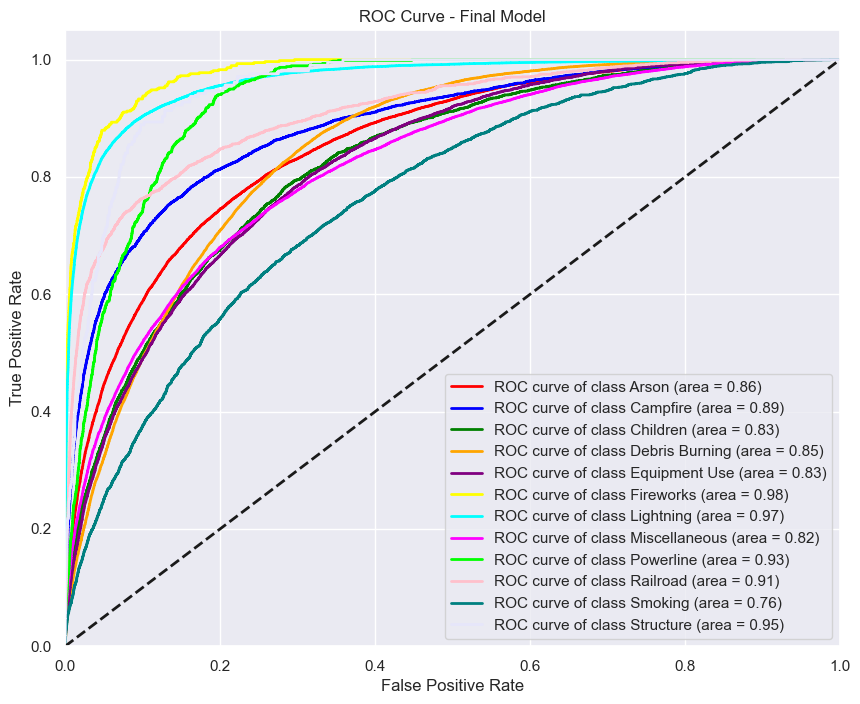

In [65]:
roc_graph_for_models('Final Model', y_val_encoded, y_pred_proba)

In [66]:
# get classification report for the final model
y_pred = final_model.predict(X_val)
report = classification_report(y_val_encoded, y_pred, zero_division=0)
print(report)

              precision    recall  f1-score   support

           0       0.57      0.52      0.54     14822
           1       0.53      0.37      0.43      4129
           2       0.43      0.10      0.16      3223
           3       0.52      0.75      0.61     22922
           4       0.44      0.26      0.33      8032
           5       0.52      0.50      0.51       581
           6       0.75      0.84      0.79     14762
           7       0.52      0.53      0.53     17365
           8       0.32      0.05      0.08       755
           9       0.50      0.38      0.44      1842
          10       0.35      0.02      0.04      2788
          11       0.18      0.02      0.03       207

    accuracy                           0.56     91428
   macro avg       0.47      0.36      0.38     91428
weighted avg       0.55      0.56      0.54     91428



# Error Analysis

we noticed that all models performed worst over the Smoking cause, we will now explore the data to see if we can find more insights.

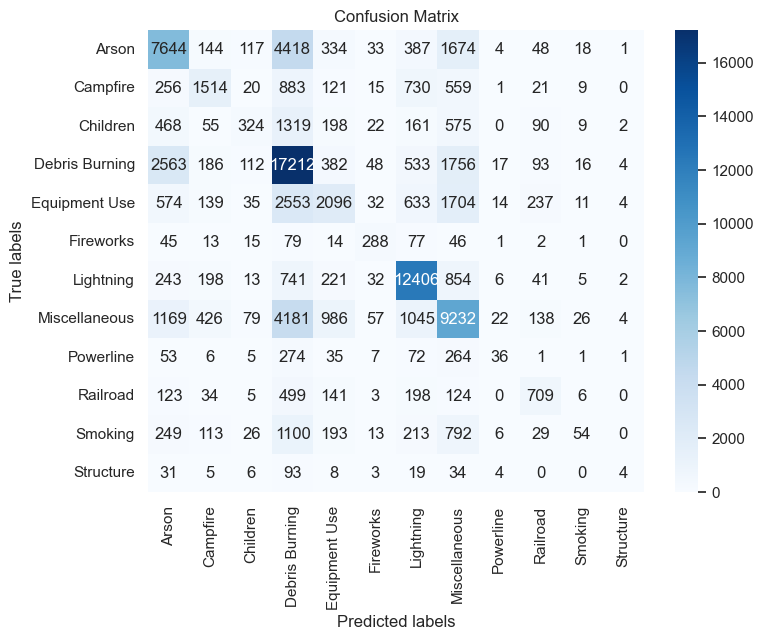

In [67]:
# Assuming y_true are the true labels and y_pred are the predicted labels
# Replace y_true and y_pred with your actual and predicted labels
y_true = y_val_encoded  # Actual labels

# Calculate the confusion matrix
conf_matrix = cm(y_true, y_pred)

# If you want to visualize the confusion matrix, you can use libraries like seaborn or matplotlib
import seaborn as sns
import matplotlib.pyplot as plt

# Define labels for your classes (if not already defined)
class_labels = label_encoder.classes_

# Create a heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=class_labels, yticklabels=class_labels)
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix')
plt.show()

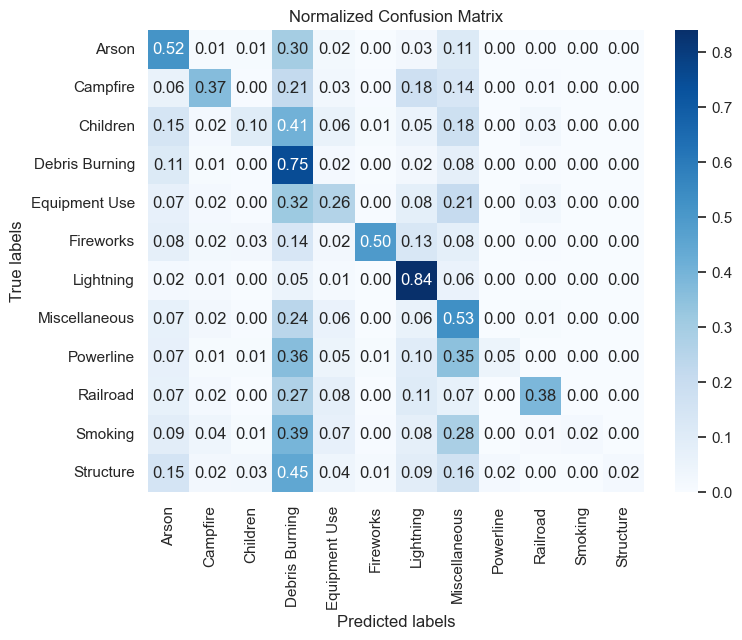

In [68]:
# show the confusion matrix but divide each cell by the sum of the row
conf_matrix_normalized = conf_matrix / conf_matrix.sum(axis=1)[:, np.newaxis]
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix_normalized, annot=True, fmt=".2f", cmap="Blues", xticklabels=class_labels, yticklabels=class_labels)
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Normalized Confusion Matrix')
plt.show()

In [69]:
# print for each cause the precentage of fires in each set
for cause in label_encoder.classes_:
    cause_fires_train = y_train.loc[y_train == cause]
    cause_fires_val = y_val.loc[y_val == cause]
    print(f"Percentage of {cause} fires in train: {len(cause_fires_train) / len(y_train) * 100:.2f}%")
    print(f"Percentage of {cause} fires in val: {len(cause_fires_val) / len(y_val) * 100:.2f}%")
    print()

Percentage of Arson fires in train: 16.40%
Percentage of Arson fires in val: 16.21%

Percentage of Campfire fires in train: 4.42%
Percentage of Campfire fires in val: 4.52%

Percentage of Children fires in train: 3.56%
Percentage of Children fires in val: 3.53%

Percentage of Debris Burning fires in train: 25.05%
Percentage of Debris Burning fires in val: 25.07%

Percentage of Equipment Use fires in train: 8.59%
Percentage of Equipment Use fires in val: 8.79%

Percentage of Fireworks fires in train: 0.68%
Percentage of Fireworks fires in val: 0.64%

Percentage of Lightning fires in train: 16.33%
Percentage of Lightning fires in val: 16.15%

Percentage of Miscellaneous fires in train: 18.94%
Percentage of Miscellaneous fires in val: 18.99%

Percentage of Powerline fires in train: 0.82%
Percentage of Powerline fires in val: 0.83%

Percentage of Railroad fires in train: 1.91%
Percentage of Railroad fires in val: 2.01%

Percentage of Smoking fires in train: 3.07%
Percentage of Smoking fire

# Test Results

In [70]:
# use already trained final model
y_pred_proba = final_model.predict_proba(X_test)
# encoded the test y
y_test_encoded = label_encoder.transform(y_test)
roc_auc_score(y_test_encoded, y_pred_proba, multi_class='ovr')

0.8790896874319722

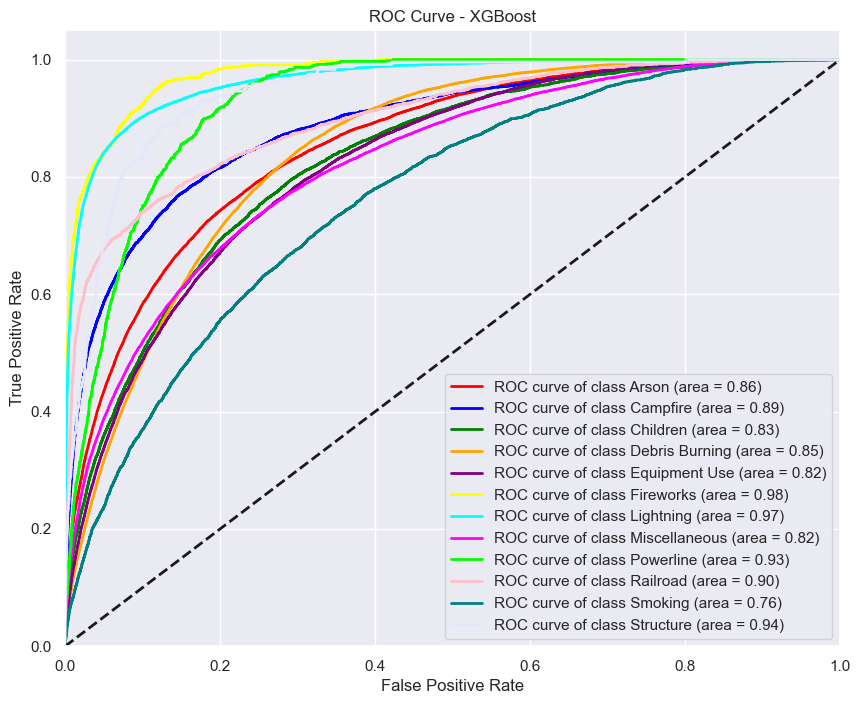

In [71]:
# graph the roc curve for the best model
roc_graph_for_models('XGBoost', y_test_encoded, y_pred_proba)